# Introduction
* Depth estimation is a crucial step towards inferring scene geometry from 2D images. The goal in monocular depth estimation is to predict the depth value of each pixel or inferring depth information, given only a single RGB image as input. This example will show an approach to build a depth estimation model with a convnet and simple loss functions.

![](https://paperswithcode.com/media/thumbnails/task/task-0000000605-d9849a91.jpg)

In [1]:
import os

os.environ["KERAS_BACKEND"] = "tensorflow"

import sys

import tensorflow as tf
import keras
from keras import layers
from keras import ops
import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt

keras.utils.set_random_seed(123)

2025-04-10 14:47:47.173248: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744296467.198288     128 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744296467.205462     128 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


# Downloading the dataset
* We will be using the dataset DIODE: A Dense Indoor and Outdoor Depth Dataset for this tutorial. However, we use the validation set generating training and evaluation subsets for our model. The reason we use the validation set rather than the training set of the original dataset is because the training set consists of 81GB of data, which is challenging to download compared to the validation set which is only 2.6GB. Other datasets that you could use are NYU-v2 and KITTI.

In [2]:
# annotation_folder = "/dataset/"
# if not os.path.exists(os.path.abspath(".") + annotation_folder):
#     annotation_zip = keras.utils.get_file("val.tar.gz",cache_subdir=os.path.abspath("."),origin="http://diode-dataset.s3.amazonaws.com/val.tar.gz",
#        extract=True)

# Preparing the dataset

In [3]:
path = "/kaggle/working/val"

filelist = []

for root, dirs, files in os.walk(path):
    for file in files:
        filelist.append(os.path.join(root, file))

filelist.sort()
data = {"image": [x for x in filelist if x.endswith(".png")],"depth": [x for x in filelist if x.endswith("_depth.npy")],
    "mask": [x for x in filelist if x.endswith("_depth_mask.npy")]}
df = pd.DataFrame(data)

df = df.sample(frac=1, random_state=42)

# Preparing hyperparameters

In [4]:
HEIGHT = 256
WIDTH = 256
LR = 0.00001
EPOCHS = 30
BATCH_SIZE = 32

# Building a data pipeline
* 1.The pipeline takes a dataframe containing the path for the RGB images, as well as the depth and depth mask files.
* 2.It reads and resize the RGB images.
* 3.It reads the depth and depth mask files, process them to generate the depth map image and resize it.
* 4.It returns the RGB images and the depth map images for a batch.

In [5]:
class DataGenerator(keras.utils.PyDataset):
    def __init__(self, data, batch_size=6, dim=(768, 1024), n_channels=3, shuffle=True):
        super().__init__()
        """
        Initialization
        """
        self.data = data
        self.indices = self.data.index.tolist()
        self.dim = dim
        self.n_channels = n_channels
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.min_depth = 0.1
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.data) / self.batch_size))

    def __getitem__(self, index):
        if (index + 1) * self.batch_size > len(self.indices):
            self.batch_size = len(self.indices) - index * self.batch_size
        # Generate one batch of data
        # Generate indices of the batch
        index = self.indices[index * self.batch_size : (index + 1) * self.batch_size]
        # Find list of IDs
        batch = [self.indices[k] for k in index]
        x, y = self.data_generation(batch)

        return x, y

    def on_epoch_end(self):
        """
        Updates indexes after each epoch
        """
        self.index = np.arange(len(self.indices))
        if self.shuffle == True:
            np.random.shuffle(self.index)

    def load(self, image_path, depth_map, mask):
        """Load input and target image."""

        image_ = cv2.imread(image_path)
        image_ = cv2.cvtColor(image_, cv2.COLOR_BGR2RGB)
        image_ = cv2.resize(image_, self.dim)
        image_ = tf.image.convert_image_dtype(image_, tf.float32)

        depth_map = np.load(depth_map).squeeze()

        mask = np.load(mask)
        mask = mask > 0

        max_depth = min(300, np.percentile(depth_map, 99))
        depth_map = np.clip(depth_map, self.min_depth, max_depth)
        depth_map = np.log(depth_map, where=mask)

        depth_map = np.ma.masked_where(~mask, depth_map)

        depth_map = np.clip(depth_map, 0.1, np.log(max_depth))
        depth_map = cv2.resize(depth_map, self.dim)
        depth_map = np.expand_dims(depth_map, axis=2)
        depth_map = tf.image.convert_image_dtype(depth_map, tf.float32)

        return image_, depth_map

    def data_generation(self, batch):
        x = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size, *self.dim, 1))

        for i, batch_id in enumerate(batch):
            x[i,], y[i,] = self.load(self.data["image"][batch_id],self.data["depth"][batch_id],self.data["mask"][batch_id])
        x, y = x.astype("float32"), y.astype("float32")
        return x, y

# Visualizing samples

I0000 00:00:1744296470.869131     128 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


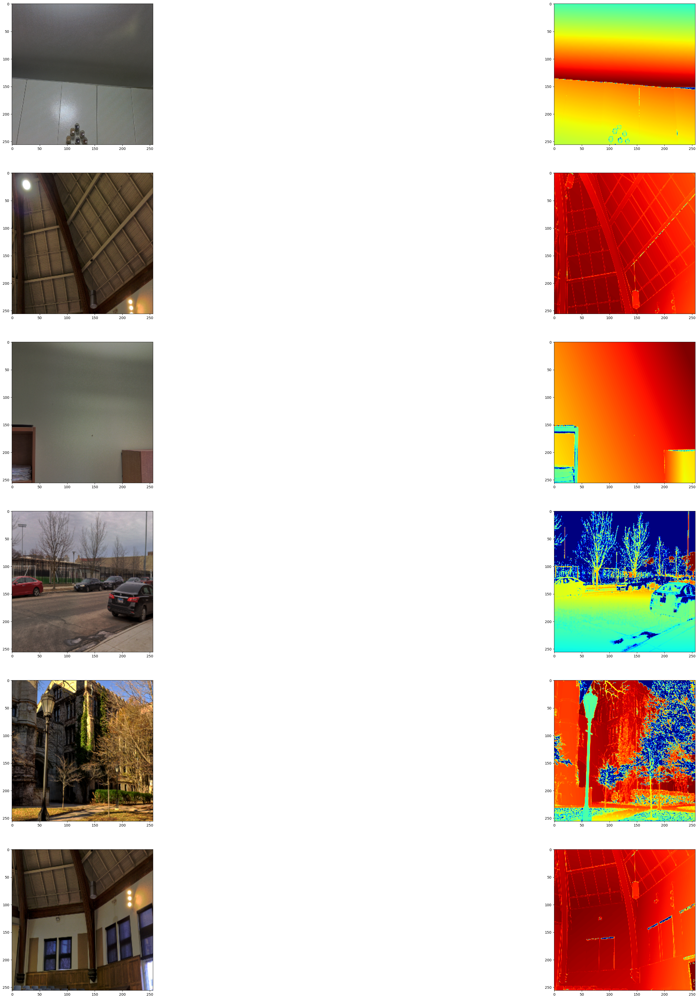

In [6]:
def visualize_depth_map(samples, test=False, model=None):
    input, target = samples
    cmap = plt.cm.jet
    cmap.set_bad(color="black")

    if test:
        pred = model.predict(input)
        fig, ax = plt.subplots(6, 3, figsize=(50, 50))
        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)
            ax[i, 2].imshow((pred[i].squeeze()), cmap=cmap)

    else:
        fig, ax = plt.subplots(6, 2, figsize=(50, 50))
        for i in range(6):
            ax[i, 0].imshow((input[i].squeeze()))
            ax[i, 1].imshow((target[i].squeeze()), cmap=cmap)


visualize_samples = next(iter(DataGenerator(data=df, batch_size=6, dim=(HEIGHT, WIDTH))))
visualize_depth_map(visualize_samples)

# 3D point cloud visualization

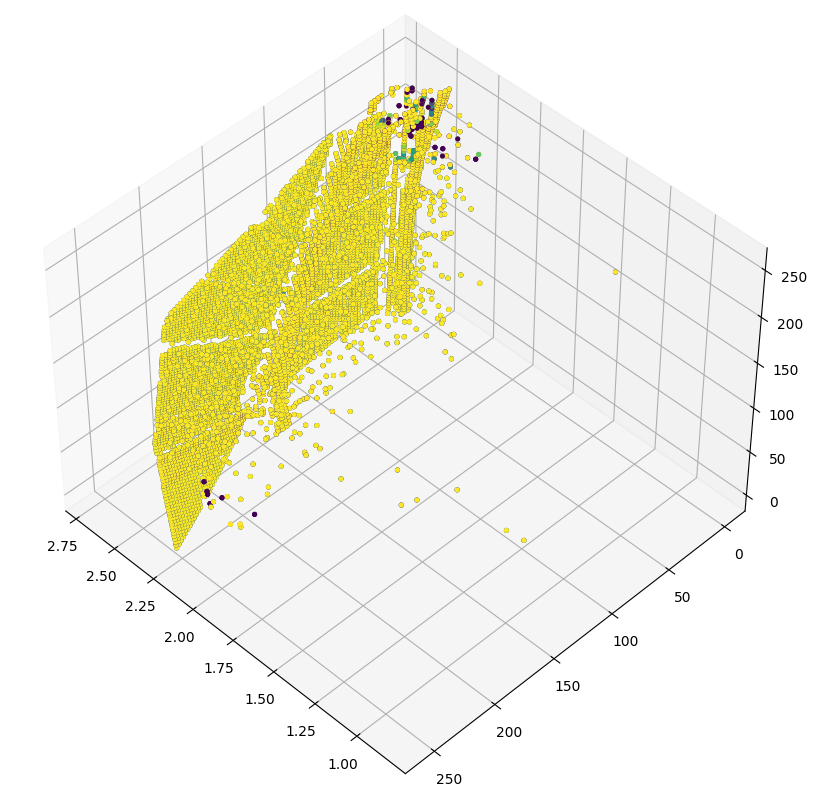

In [7]:
depth_vis = np.flipud(visualize_samples[1][1].squeeze())  # target
img_vis = np.flipud(visualize_samples[0][1].squeeze())  # input

fig = plt.figure(figsize=(15, 10))
ax = plt.axes(projection="3d")

STEP = 3
for x in range(0, img_vis.shape[0], STEP):
    for y in range(0, img_vis.shape[1], STEP):
        ax.scatter([depth_vis[x, y]] * 3,[y] * 3,[x] * 3,c=tuple(img_vis[x, y, :3] / 255),s=7)
    ax.view_init(45, 135)

# Building the model
* The basic model is from U-Net.
* Addditive skip-connections are implemented in the downscaling block.

In [8]:
class DownscaleBlock(layers.Layer):
    def __init__(self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs):
        super().__init__(**kwargs)
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = layers.LeakyReLU(negative_slope=0.2)
        self.reluB = layers.LeakyReLU(negative_slope=0.2)
        self.bn2a = layers.BatchNormalization()
        self.bn2b = layers.BatchNormalization()

        self.pool = layers.MaxPool2D((2, 2), (2, 2))

    def call(self, input_tensor):
        d = self.convA(input_tensor)
        x = self.bn2a(d)
        x = self.reluA(x)

        x = self.convB(x)
        x = self.bn2b(x)
        x = self.reluB(x)

        x += d
        p = self.pool(x)
        return x, p


class UpscaleBlock(layers.Layer):
    def __init__(self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs):
        super().__init__(**kwargs)
        self.us = layers.UpSampling2D((2, 2))
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = layers.LeakyReLU(negative_slope=0.2)
        self.reluB = layers.LeakyReLU(negative_slope=0.2)
        self.bn2a = layers.BatchNormalization()
        self.bn2b = layers.BatchNormalization()
        self.conc = layers.Concatenate()

    def call(self, x, skip):
        x = self.us(x)
        concat = self.conc([x, skip])
        x = self.convA(concat)
        x = self.bn2a(x)
        x = self.reluA(x)

        x = self.convB(x)
        x = self.bn2b(x)
        x = self.reluB(x)

        return x


class BottleNeckBlock(layers.Layer):
    def __init__(self, filters, kernel_size=(3, 3), padding="same", strides=1, **kwargs):
        super().__init__(**kwargs)
        self.convA = layers.Conv2D(filters, kernel_size, strides, padding)
        self.convB = layers.Conv2D(filters, kernel_size, strides, padding)
        self.reluA = layers.LeakyReLU(negative_slope=0.2)
        self.reluB = layers.LeakyReLU(negative_slope=0.2)

    def call(self, x):
        x = self.convA(x)
        x = self.reluA(x)
        x = self.convB(x)
        x = self.reluB(x)
        return x

# Defining the loss
* We will optimize 3 losses in our mode. 1. Structural similarity index(SSIM). 2. L1-loss, or Point-wise depth in our case. 3. Depth smoothness loss.

* Out of the three loss functions, SSIM contributes the most to improving model performance.

In [9]:
def image_gradients(image):
    if len(ops.shape(image)) != 4:
        raise ValueError("image_gradients expects a 4D tensor " "[batch_size, h, w, d], not {}.".format(ops.shape(image)))

    image_shape = ops.shape(image)
    batch_size, height, width, depth = ops.unstack(image_shape)

    dy = image[:, 1:, :, :] - image[:, :-1, :, :]
    dx = image[:, :, 1:, :] - image[:, :, :-1, :]

    # Return tensors with same size as original image by concatenating
    # zeros. Place the gradient [I(x+1,y) - I(x,y)] on the base pixel (x, y).
    shape = ops.stack([batch_size, 1, width, depth])
    dy = ops.concatenate([dy, ops.zeros(shape, dtype=image.dtype)], axis=1)
    dy = ops.reshape(dy, image_shape)

    shape = ops.stack([batch_size, height, 1, depth])
    dx = ops.concatenate([dx, ops.zeros(shape, dtype=image.dtype)], axis=2)
    dx = ops.reshape(dx, image_shape)

    return dy, dx


class DepthEstimationModel(keras.Model):
    def __init__(self):
        super().__init__()
        self.ssim_loss_weight = 0.85
        self.l1_loss_weight = 0.1
        self.edge_loss_weight = 0.9
        self.loss_metric = keras.metrics.Mean(name="loss")
        f = [16, 32, 64, 128, 256]
        self.downscale_blocks = [DownscaleBlock(f[0]),DownscaleBlock(f[1]),DownscaleBlock(f[2]),DownscaleBlock(f[3])]
        self.bottle_neck_block = BottleNeckBlock(f[4])
        self.upscale_blocks = [UpscaleBlock(f[3]),UpscaleBlock(f[2]),UpscaleBlock(f[1]),UpscaleBlock(f[0])]
        self.conv_layer = layers.Conv2D(1, (1, 1), padding="same", activation="tanh")

    def calculate_loss(self, target, pred):
        # Edges
        dy_true, dx_true = image_gradients(target)
        dy_pred, dx_pred = image_gradients(pred)
        weights_x = ops.cast(ops.exp(ops.mean(ops.abs(dx_true))), "float32")
        weights_y = ops.cast(ops.exp(ops.mean(ops.abs(dy_true))), "float32")

        # Depth smoothness
        smoothness_x = dx_pred * weights_x
        smoothness_y = dy_pred * weights_y

        depth_smoothness_loss = ops.mean(abs(smoothness_x)) + ops.mean(abs(smoothness_y))

        # Structural similarity (SSIM) index
        ssim_loss = ops.mean(1- tf.image.ssim(target, pred, max_val=WIDTH, filter_size=7, k1=0.01**2, k2=0.03**2))
        # Point-wise depth
        l1_loss = ops.mean(ops.abs(target - pred))

        loss = ((self.ssim_loss_weight * ssim_loss)+ (self.l1_loss_weight * l1_loss)+ (self.edge_loss_weight * depth_smoothness_loss))

        return loss

    @property
    def metrics(self):
        return [self.loss_metric]

    def train_step(self, batch_data):
        input, target = batch_data
        with tf.GradientTape() as tape:
            pred = self(input, training=True)
            loss = self.calculate_loss(target, pred)

        gradients = tape.gradient(loss, self.trainable_variables)
        self.optimizer.apply_gradients(zip(gradients, self.trainable_variables))
        self.loss_metric.update_state(loss)
        return {"loss": self.loss_metric.result()}

    def test_step(self, batch_data):
        input, target = batch_data

        pred = self(input, training=False)
        loss = self.calculate_loss(target, pred)

        self.loss_metric.update_state(loss)
        return {"loss": self.loss_metric.result()}

    def call(self, x):
        c1, p1 = self.downscale_blocks[0](x)
        c2, p2 = self.downscale_blocks[1](p1)
        c3, p3 = self.downscale_blocks[2](p2)
        c4, p4 = self.downscale_blocks[3](p3)

        bn = self.bottle_neck_block(p4)

        u1 = self.upscale_blocks[0](bn, c4)
        u2 = self.upscale_blocks[1](u1, c3)
        u3 = self.upscale_blocks[2](u2, c2)
        u4 = self.upscale_blocks[3](u3, c1)

        return self.conv_layer(u4)

# Compile Model

In [10]:
optimizer = keras.optimizers.SGD(learning_rate=LR,nesterov=False)
model = DepthEstimationModel()
model.compile(optimizer)
  

# Train Model

In [11]:
train_loader = DataGenerator(data=df[:260].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH))
validation_loader = DataGenerator(data=df[260:].reset_index(drop="true"), batch_size=BATCH_SIZE, dim=(HEIGHT, WIDTH))
history=model.fit(train_loader,epochs=EPOCHS,validation_data=validation_loader)


Epoch 1/30


I0000 00:00:1744296561.910661     180 service.cc:148] XLA service 0x7d968801e810 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1744296561.911597     180 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
W0000 00:00:1744296562.316306     180 assert_op.cc:38] Ignoring Assert operator SSIM/Assert/Assert
W0000 00:00:1744296562.317422     180 assert_op.cc:38] Ignoring Assert operator SSIM/Assert_1/Assert
W0000 00:00:1744296562.318179     180 assert_op.cc:38] Ignoring Assert operator SSIM/Assert_2/Assert
W0000 00:00:1744296562.318750     180 assert_op.cc:38] Ignoring Assert operator SSIM/Assert_3/Assert
I0000 00:00:1744296562.616125     180 cuda_dnn.cc:529] Loaded cuDNN version 90300


1/9 ━━━━━━━━━━━━━━━━━━━━ 3:42 28s/step - loss: 0.8762

I0000 00:00:1744296569.457979     180 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1744296569.732361     181 assert_op.cc:38] Ignoring Assert operator SSIM/Assert/Assert
W0000 00:00:1744296569.732666     181 assert_op.cc:38] Ignoring Assert operator SSIM/Assert_1/Assert
W0000 00:00:1744296569.733151     181 assert_op.cc:38] Ignoring Assert operator SSIM/Assert_2/Assert
W0000 00:00:1744296569.733405     181 assert_op.cc:38] Ignoring Assert operator SSIM/Assert_3/Assert


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - loss: 0.9293

W0000 00:00:1744296594.932256     179 assert_op.cc:38] Ignoring Assert operator SSIM/Assert/Assert
W0000 00:00:1744296594.933469     179 assert_op.cc:38] Ignoring Assert operator SSIM/Assert_1/Assert
W0000 00:00:1744296594.934612     179 assert_op.cc:38] Ignoring Assert operator SSIM/Assert_2/Assert
W0000 00:00:1744296594.935271     179 assert_op.cc:38] Ignoring Assert operator SSIM/Assert_3/Assert
W0000 00:00:1744296624.201442     178 assert_op.cc:38] Ignoring Assert operator SSIM/Assert/Assert
W0000 00:00:1744296624.201711     178 assert_op.cc:38] Ignoring Assert operator SSIM/Assert_1/Assert
W0000 00:00:1744296624.202112     178 assert_op.cc:38] Ignoring Assert operator SSIM/Assert_2/Assert
W0000 00:00:1744296624.202403     178 assert_op.cc:38] Ignoring Assert operator SSIM/Assert_3/Assert


9/9 ━━━━━━━━━━━━━━━━━━━━ 87s 7s/step - loss: 0.9300 - val_loss: 0.9038
Epoch 2/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 36s 4s/step - loss: 0.8719 - val_loss: 0.8966
Epoch 3/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 252ms/step - loss: 0.9154

W0000 00:00:1744296670.307741     179 assert_op.cc:38] Ignoring Assert operator SSIM/Assert/Assert
W0000 00:00:1744296670.308018     179 assert_op.cc:38] Ignoring Assert operator SSIM/Assert_1/Assert
W0000 00:00:1744296670.308479     179 assert_op.cc:38] Ignoring Assert operator SSIM/Assert_2/Assert
W0000 00:00:1744296670.308762     179 assert_op.cc:38] Ignoring Assert operator SSIM/Assert_3/Assert


9/9 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - loss: 0.9171 - val_loss: 0.8854
Epoch 4/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - loss: 0.9177 - val_loss: 0.8812
Epoch 5/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - loss: 0.8611 - val_loss: 0.8785
Epoch 6/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - loss: 0.8598 - val_loss: 0.8788
Epoch 7/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - loss: 0.8201 - val_loss: 0.8734
Epoch 8/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - loss: 0.8239 - val_loss: 0.8711
Epoch 9/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - loss: 0.9062 - val_loss: 0.8692
Epoch 10/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - loss: 0.8818 - val_loss: 0.8663
Epoch 11/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - loss: 0.8403 - val_loss: 0.8639
Epoch 12/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - loss: 0.8769 - val_loss: 0.8618
Epoch 13/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - loss: 0.8859 - val_loss: 0.8594
Epoch 14/30
9/9 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - loss: 0.7452 - val_loss: 0.8604
Epoch 15/30
9/9 ━━━━━━

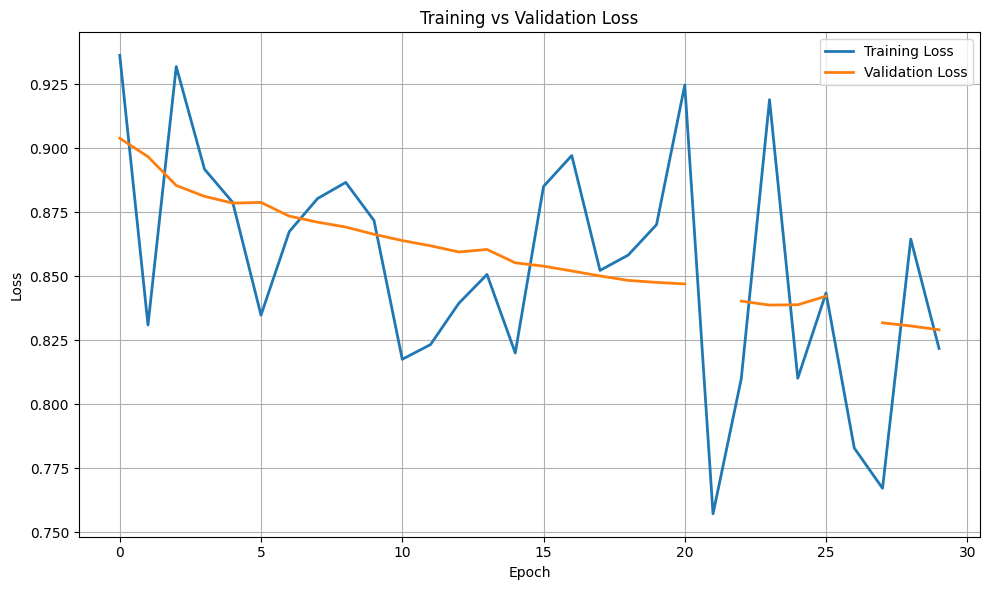

In [12]:
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss', linewidth=2)
plt.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Visualizing model output
* We visualize the model output over the validation set. The first image is the RGB image, the second image is the ground truth depth map image and the third one is the predicted depth map image.

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


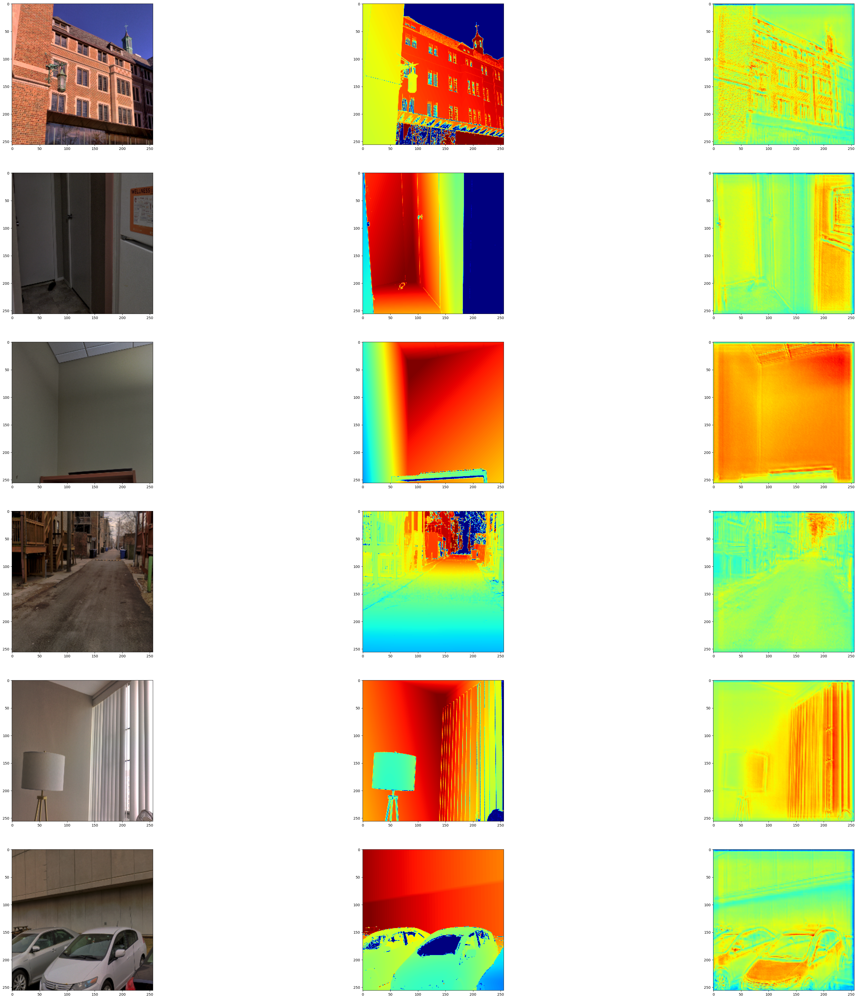

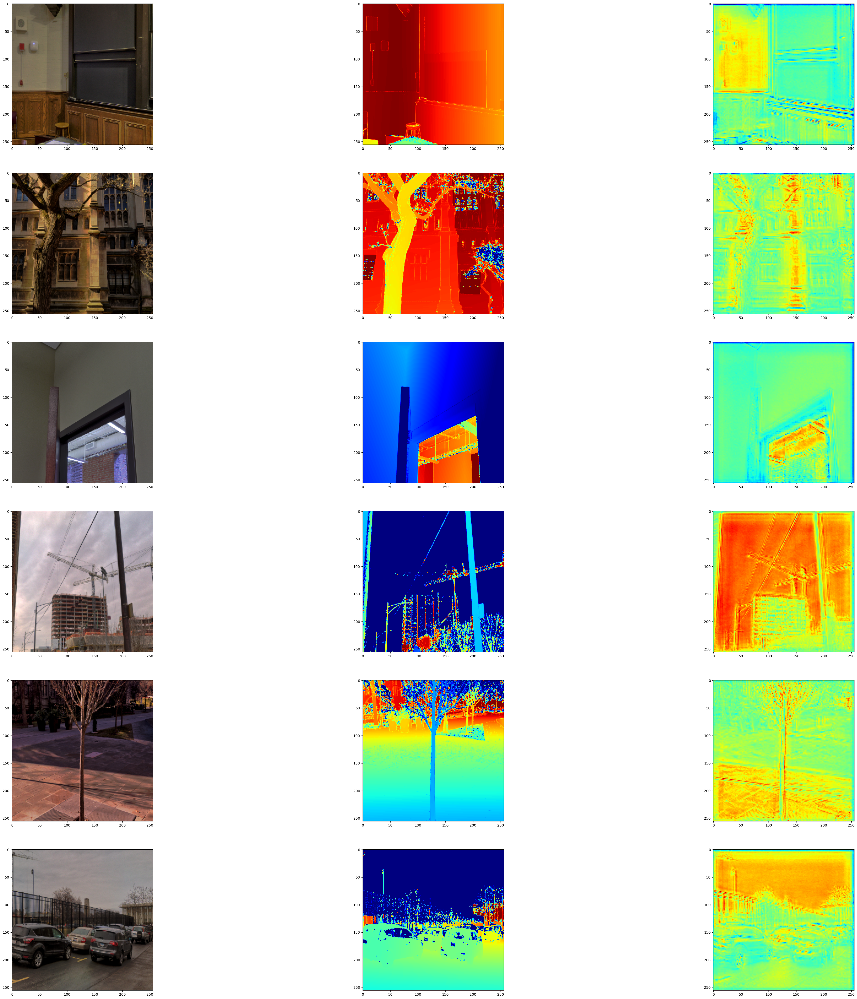

In [13]:
test_loader = next(iter(DataGenerator(data=df[265:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH))))
visualize_depth_map(test_loader, test=True, model=model)

test_loader = next(iter(DataGenerator(data=df[300:].reset_index(drop="true"), batch_size=6, dim=(HEIGHT, WIDTH))))
visualize_depth_map(test_loader, test=True, model=model)